# Imagen 3 Image Editing

다음 예제에서는 아래와 같은 Edit Mode를 사용함

- Subject 변경
    - Foreground Subject을 다른 개체로 변경하는 경우 : 예) 개 --> 고양이  >> **EDIT_MODE_DEFAULT (Foreground Mask)**
    - Foreground Subject의 일부나 동작을 변경하는 경우 : 빨강 공을 물고 있는 강아지 --> 파란공을 물고 있는 강아지 >> **SUBJECT_EDITING** 
- Background 변경
    - 대부분의 Background 변경 >>  **SUBJECT_EDITING** 
    - 전반적인 무드 변경이나 스타일 변경 >> **INSTRUCT_EDITING**


In [ ]:
%pip install --upgrade --user google-cloud-aiplatform

### Restart runtime

To use the newly installed packages in this Jupyter runtime, you must restart the runtime. You can do this by running the cell below, which restarts the current kernel.

The restart might take a minute or longer. After it's restarted, continue to the next step.

In [ ]:
import IPython

app = IPython.Application.instance()
app.kernel.do_shutdown(True)

In [7]:
PROJECT_ID = "[YOUR-PROJECT-ID]"  # @param {type:"string"}
BUCKET = "gs://[BUCKET]"
LOCATION = "us-central1"  # @param {type:"string"}

import vertexai

vertexai.init(project=PROJECT_ID, location=LOCATION)

In [8]:
from vertexai.generative_models import (
    GenerativeModel,
    Part,
    GenerationConfig,
    
)

from vertexai.preview.vision_models import (
    ControlReferenceImage,
    Image,
    ImageGenerationModel,
    MaskReferenceImage,
    RawReferenceImage,
    SubjectReferenceImage,
)

In [9]:
import matplotlib.pyplot as plt

def display_images(image_list, title_list) -> None:
    fig, axis = plt.subplots(1, len(image_list), figsize=(6*len(image_list), 6))
    i = 0
    for image, title in zip(image_list, title_list):
        axis[i].imshow(image._pil_image)
        axis[i].set_title(title)
        i = i + 1

    for ax in axis:
        ax.axis("off")
    plt.show()

In [10]:
edit_model = ImageGenerationModel.from_pretrained("imagen-3.0-capability-001")

In [11]:
import json

def call_gemini_for_editing(image_path, prompt):
    org_image = Part.from_uri(f"{BUCKET}/{image_path}",mime_type="image/png")
    prompt_template = f"""
        You're an advertising professional utilizing Imagen for ad creation. 
        Generate an English Imagen prompt that will transform the provided image to meet the user's specifications.

        User Request: {prompt} 

        <instructions>

        <task1> Analyze the original photo and write a detailed description of it including photo or painting style (within 60 tokens). </task1>

        <task2> Identify and describe the most central object in the original photo (within 20 tokens). </task2>

        <task3> 
        Analyze the user request and identify the edit type:

        * SUBJECT_EDITING: Keep the main object itself but change its position,its motion, background, color of background, or anything besides of main object. 
            * If the new editing prompt wants to change mood of background such as dark/bright, groomy, sunny/rainy/snowy day, use INSTRUCT_EDITING.
            * If the new editing prompt wants to customize the original main object such as motion or small portion of the main object (e.g., a cat hoiding a ball into a cat holding a Frisbee), use SUBJECT_EDITING
            * (e.g., "Generate an image of the girl[1] with a happy expression, looking directly at the camera. Her head should be tilted slightly to the right.")

        * CONTROLLED_EDITING: Maintain the overall image composition but change color, tone, or convert canny map to image. 
            * (e.g., "Generate an image aligning with the canny map [1] to match the description: This image shows the iconic Eiffel Tower in Paris, France, with a beautiful sunset in the background.")

        * INSTRUCT_EDITING: Change overall image composition and pating style or cartoon style. 
            * If the new editing prompt requires a very significant change to a main object, use INSTRUCT_EDITING. 
            * If the original image doesn't appear clear (e.g., oil painting style, pencil drawing style), use INSTRUCT_EDITING. 
            * If the new editing prompt wants to change one main object to more than two objects (e.g., a cat into three ducks), use INSTRUCT_EDITING. 
            * (e.g., "Transform the subject in image [1] into a cartoon character with a big smile and a colorful outfit.")
            * (e.g., "Transform image [1] into a oil painting style with ...")

        * EDIT_MODE_DEFAULT: 
            * If the new prompt wants to keep a main object but wants to change motion or small part of the main object(e.g.,  change a carrot in a rabbit's mouth into a radish), use SUBJECT_EDITING 
            * If the original image doesn't appear clear (e.g., oil painting style, pencil drawing style), use INSTRUCT_EDITING. 
            * If the new prompt requires a change to a main object, one species to the other (e.g., change from a cat into a dog - the size of the changed main object is similar to the original object), use EDIT_MODE_DEFAULT. 
  
            
        Store this information in the `edit_type` variable. 
        </task3>

        <task4> Clearly explain the relationship between the user request and the extracted main object or background. Add this explanation to the edit_mode_selection_reason field. </task4>

        <task5> Determine the edit mode based on the user request:
        inpainting-insert: Add or change the main object or background for EDIT_MODE_DEFAULT.
        inpainting-remove: Remove the main object or background for EDIT_MODE_DEFAULT.
        outpainting: Extend the background for EDIT_MODE_DEFAULT.
        default: Apply changes to the entire image
        Store this information in the edit_mode variable. </task5>

        <task6> Determine the mask mode:
        NONE: No mask needed for STYLE_EDITING.
        MASK_MODE_FOREGROUND: Mask the main object for edits focused on it for EDIT_MODE_DEFAULT when the size of the changed main object is similar to the original object.
        MASK_MODE_BACKGROUND: Mask the background for edits focused on it.
        MASK_MODE_DEFAULT: Mask the entire image for edits.
        Store this information in the mask_mode variable. </task6>

        <task7> Determine the subject type for SUBJECT_EDITING:
        person: If the main object is a person.
        animal: If the main object is an animal.
        product: If the main object is a product.
        default: For all other cases.
        Store this information in the subject_type variable. You must use one of the values [person, animal, product, default] in the subject_type field. </task7>

        <task8> Write a imagen positive_prompt in English:
        For SUBJECT_EDITING : make a prompt that describes the final desired image in the positive prompt with reference id. 
            * (e.g., "Generate an image of the girl[1] with a happy expression, lookin directly at the camera. Her head should be tilted slightly to the right")
        For STYLE_EDITING : make a prompt that describe the final desired image with given reference style image ID. 
            * (e.g., "Generate an image in mosaic stle [1] based on the following caption : Brilliant NY City skylines.").
        For CONTROLLED_EDITING : provide a detailed description of the final desired image with reference image ID. 
            * (e.g., "Generate an image aligning with the scribble map [1] to match the description: This image shows the iconic Eiffel Tower in Paris, France, with a beautiful sunset in the background.")
        For INSTRUCT_EDITING :  
            * If the new editing prompt want to change the style of the entire image, provide a command ('Transfer the subject in images[1] into a ...') and detailed description of the final desired image with reference image ID. (e.g., "Transform the subject in image [1] into a cartoon character with a big smile and a colorful outfit.")
            * If the new editing prompt want to convert one main object into several main objects, provide a detailed description of the final desired image in the positive prompt.
        In other cases, provide a detailed description of the final desired image in the positive prompt (within 120 tokens) and list important forbidden keywords in the negative prompt(within 60 Tokens). </task8>

        <task9> Guidance scale is a value that indicates the degree of influence a prompt has on an image. 
        When modifying the foreground, a value - 1.0 is generally used, while for background modifications, a value greater than 1.0 is used - generally 20. 
        Especially when the difference between the existing background and the desired background is significant during background modification, the guidance scale can be increased up to 20.0 to strengthen the influence of the prompt.</task9>

        <task10> The Mask Dilation value determines the degree to which the original image is reflected in the resulting image. 
        For minimal modifications to the original image, a value of 0.005 is recommended. For more significant alterations, a maximum value of 0.03 is appropriate. </task10>

        <task11> control_type is a value that determines the type of the given image. Choose one of the following values:
        CONTROL_TYPE_SCRIBBLE : when the original image is a scribble map. 
        CONTROL_TYPE_CANNY : when the original image is a Canny edge map. 
        If there is no matching value, use CONTROL_TYPE_SCRIBBLE.
        The value of control_type MUST be one of the following: [CONTROL_TYPE_SCRIBBLE, CONTROL_TYPE_CANNY].
        </task11>

        <task12> All outputs should be in English. </task12>

        <task13> Please DO NOT REPEAT same words in the negative prompt. </task13>

        </instructions>

        <output>
        {{
        "org_image_description" : ...,
        "main_object_description" : ...,
        "edit_type" : ...,
        "edit_mode_selection_reason": ...,
        "edit_mode" : ...,
        "mask_mode" : ...,
        "subject_type" : ...,
        "positive_prompt" : ...,
        "negative_prompt" : ...,
        "guidance_scale" : ...,
        "mask_dilation" : ...,
        "control_type" : ...
        }}
        </output>
        """

    response_schema = {
        "type" : "OBJECT",
        "properties" : {
            "org_image_description": {"type": "STRING"},
            "main_object_description": {"type": "STRING"},
            "edit_type": {"type": "STRING"},
            "edit_mode_selection_reason": {"type": "STRING"},
            "edit_mode": {"type": "STRING"},
            "mask_mode": {"type": "STRING"},
            "subject_type": {"type": "STRING"},
            "positive_prompt": {"type": "STRING"},
            "negative_prompt": {"type": "STRING"},
            "guidance_scale": {"type": "STRING"},
            "mask_dilation": {"type": "STRING"},
            "control_type": {"type": "STRING"},
        }
    }
    model = GenerativeModel("gemini-1.5-flash")
    response = model.generate_content(
        [org_image, prompt_template],
        generation_config=GenerationConfig(
            max_output_tokens=4192,
            temperature=0.6,
            top_p=0.93,
            top_k=32,
            response_mime_type="application/json", response_schema=response_schema
        )
    )    
    json_response = json.loads(response.text)

    return image_path, json_response


In [12]:
def edit_image(original_image_url, edit_json) -> None:   
    org_image = Image(gcs_uri=f"{BUCKET}/{original_image_url}")
    raw_ref_image = RawReferenceImage(image=org_image, reference_id=0)

    image_list = []
    title_list = []

    print(edit_json["edit_type"])
    print(edit_json["positive_prompt"])

    if edit_json["edit_type"] == "EDIT_MODE_DEFAULT" :
        if edit_json["edit_mode"] == "default" :
            edited_image = edit_model.edit_image(
                prompt=edit_json["positive_prompt"],
                negative_prompt=edit_json["negative_prompt"],
                edit_mode=edit_json["edit_mode"],
                reference_images=[raw_ref_image],
                number_of_images=1,
                guidance_scale=float(edit_json["guidance_scale"]),
                safety_filter_level="block_some",
                person_generation="allow_adult",
            )
        else :
            if edit_json["mask_mode"] == "MASK_MODE_FOREGROUND":
                mask_ref_image = MaskReferenceImage(reference_id=1, image=None, mask_mode="foreground", dilation=float(edit_json["mask_dilation"])) 

            elif edit_json["mask_mode"] == "MASK_MODE_BACKGROUND":
                mask_ref_image = MaskReferenceImage(reference_id=1, image=None, mask_mode="background")
            
            edited_image = edit_model.edit_image(
                prompt=edit_json["positive_prompt"],
                negative_prompt=edit_json["negative_prompt"],
                edit_mode=edit_json["edit_mode"],
                reference_images=[raw_ref_image, mask_ref_image],
                number_of_images=1,
                guidance_scale=float(edit_json["guidance_scale"]),
                safety_filter_level="block_some",
                person_generation="allow_adult",
            )
      
    elif edit_json["edit_type"] == "SUBJECT_EDITING" :
        subject_reference_image = SubjectReferenceImage(
                reference_id=1,
                image=org_image,
                subject_description=edit_json["main_object_description"],
                subject_type=edit_json["subject_type"],
            )

        edited_image = edit_model._generate_images(
                prompt=edit_json["positive_prompt"],
                negative_prompt=edit_json["negative_prompt"],
                number_of_images=1,
                aspect_ratio="16:9",
                reference_images=[subject_reference_image],
                guidance_scale=float(edit_json["guidance_scale"]),
                safety_filter_level="block_some",
                person_generation="allow_adult",
            )       
    elif edit_json["edit_type"] == "CONTROLLED_EDITING" :
        control_image = ControlReferenceImage(
            reference_id=1, image=org_image, control_type="canny", enable_control_image_computation=True
        )
       
        edited_image= edit_model._generate_images(
                prompt=f"Generate an image aligning with the raw reference image [1] to match the description: {edit_json['positive_prompt']}",
                negative_prompt=edit_json["negative_prompt"],
                number_of_images=1,
                aspect_ratio="16:9",
                reference_images=[control_image],
                guidance_scale=float(edit_json["guidance_scale"]),
                safety_filter_level="block_some",
                person_generation="allow_adult",
        )     
    elif edit_json["edit_type"] == "INSTRUCT_EDITING" :
       edited_image = edit_model._generate_images(
                prompt=edit_json["positive_prompt"],
                negative_prompt=edit_json["negative_prompt"],
                number_of_images=1,
                aspect_ratio="16:9",
                reference_images=[raw_ref_image],
                safety_filter_level="block_some",
                person_generation="allow_adult",
            ) 

    
    image_list = [org_image, edited_image[0] ]
    title_list = ["original", "edited"]
    display_images(image_list,title_list) 

EDIT_MODE_DEFAULT
A cat running towards the camera in a grassy field, holding a red ball in its mouth. The cat is in focus and the lighting is bright.


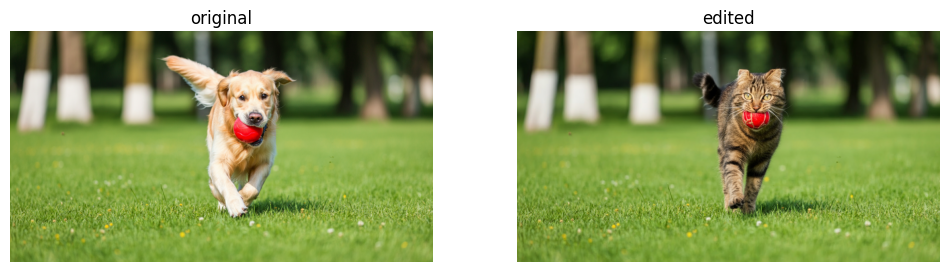

In [270]:
image_url, prompt_json = call_gemini_for_editing("20250114134343 공원에서 강아지가 공을 쫓는 모습.png","강아지를 고양이로 바꿔줘")
edit_image(image_url, prompt_json)

SUBJECT_EDITING
A golden retriever running through a grassy field, holding a blue ball in its mouth. The background is blurred, showing trees and green grass. The dog is looking directly at the camera.


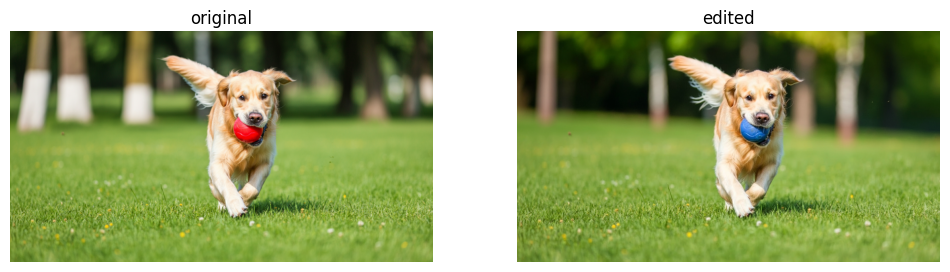

In [280]:
image_url, prompt_json = call_gemini_for_editing("20250114134343 공원에서 강아지가 공을 쫓는 모습.png","파란공으로 바꿔줘")
edit_image(image_url, prompt_json)

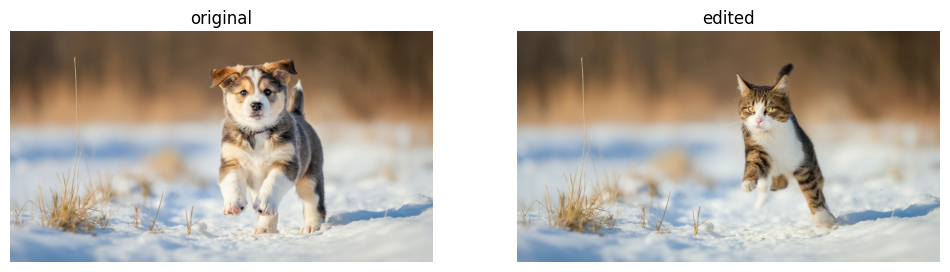

In [47]:
image_url, prompt_json = call_gemini_for_editing("20250114142443 강아지가 눈밭에서 신나게 뛰어노는 모습.png","강아지를 고양이로 바꿔줘")
edit_image(image_url, prompt_json)

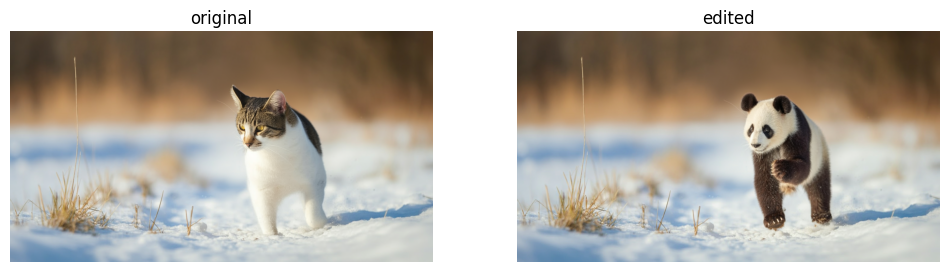

In [49]:
image_url, prompt_json = call_gemini_for_editing("20250114142628 edit cat.png","고양이를 팬더로 바꿔줘")
edit_image(image_url, prompt_json)

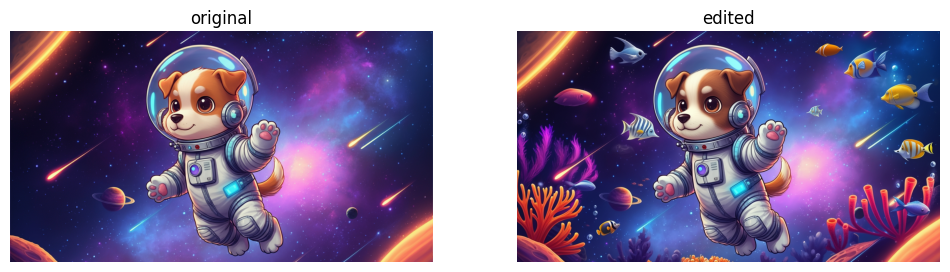

In [71]:
image_url, prompt_json = call_gemini_for_editing("20250114142848 우주복 입은 강아지, 만화책 스타일.png","우주를 심해 배경으로 바꿔줘")
edit_image(image_url, prompt_json)

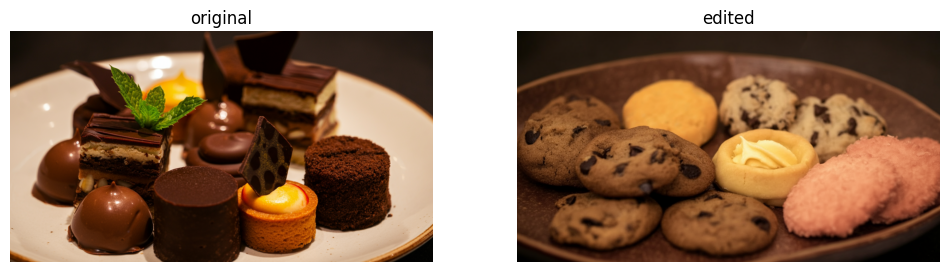

In [75]:
image_url, prompt_json = call_gemini_for_editing("20250114143241 초콜릿 디저트가 놓인 플레이트.png","초콜릿을 과자로 바꿔줘")
edit_image(image_url, prompt_json)

SUBJECT_EDITING


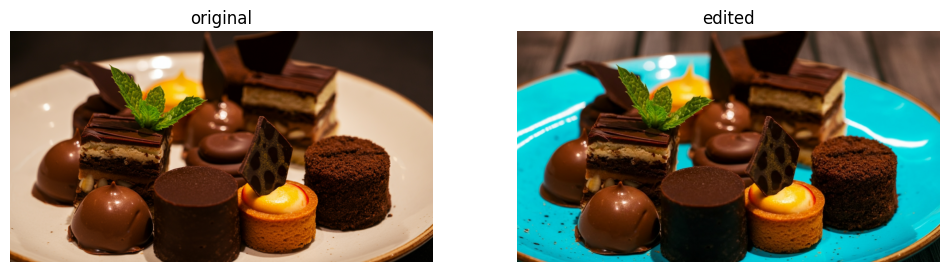

In [95]:
image_url, prompt_json = call_gemini_for_editing("20250114143241 초콜릿 디저트가 놓인 플레이트.png","접시를 파란색으로 바꿔줘")
edit_image(image_url, prompt_json)

INSTRUCT_EDITING
Transform the image into a sunny day scene with a clear blue sky and bright sunlight. The people are still walking under umbrellas, but the overall atmosphere should be cheerful and bright.


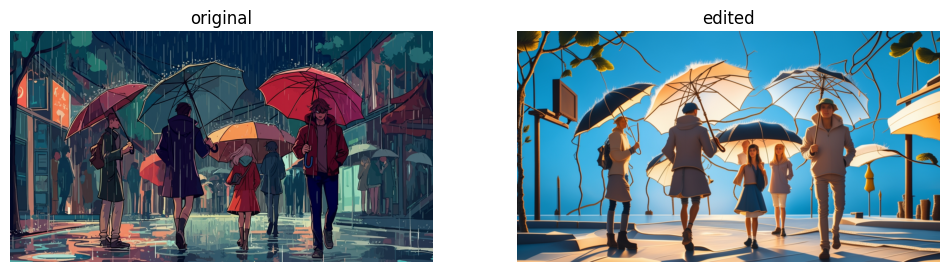

In [310]:
image_url, prompt_json = call_gemini_for_editing("20250114143604 비오는 날 우산 쓴 사람들, 만화책 스타일.png","맑은 날 배경으로 바꿔줘")
edit_image(image_url, prompt_json)

SUBJECT_EDITING
A cute brown rabbit with long ears eating a radish. The rabbit is looking directly at the camera and has a cute expression. The background is blurry and green, with some grass blades visible.


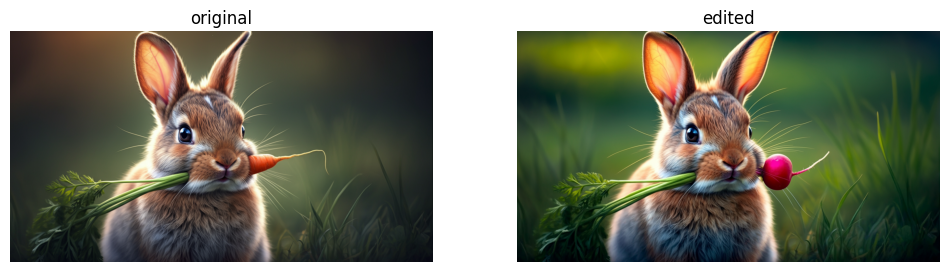

In [286]:
image_url, prompt_json = call_gemini_for_editing("20250114143744 당근을 입에 물고있는 토끼.png","당근을 무로 바꿔줘")
#prompt_json
edit_image(image_url, prompt_json)

EDIT_MODE_DEFAULT


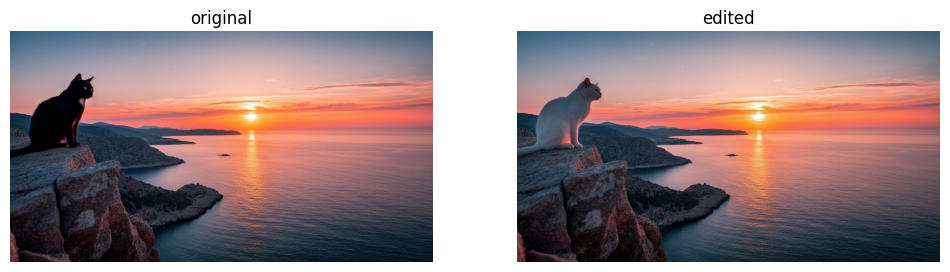

In [129]:
image_url, prompt_json = call_gemini_for_editing("20250114144002 검은 고양이, 석양이 지는 바다.png","고양이를 하얀색으로 바꿔줘")
edit_image(image_url, prompt_json)

INSTRUCT_EDITING
A white cat sitting on a cliff overlooking a stormy sea, with dark clouds and lightning in the sky. The sea is rough and choppy, with waves crashing against the rocks.


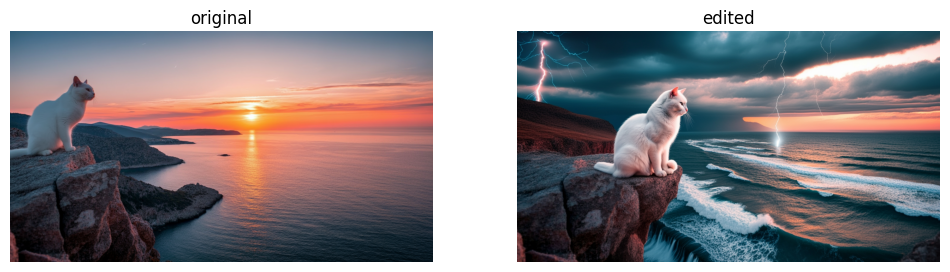

In [309]:
image_url, prompt_json = call_gemini_for_editing("20250114144039 edit white cat.png","폭풍우 치는 바다 배경으로 바꿔줘")
edit_image(image_url, prompt_json)

SUBJECT_EDITING


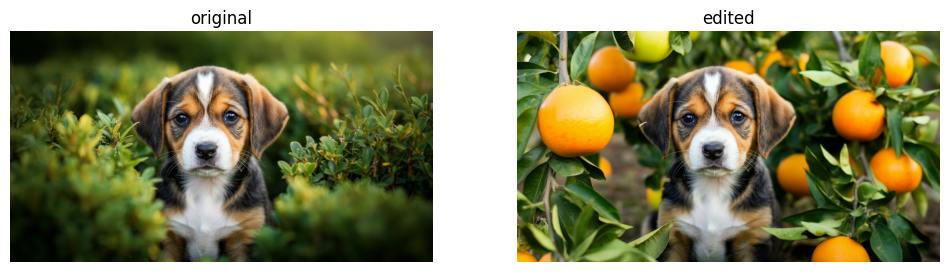

In [141]:
image_url, prompt_json = call_gemini_for_editing("20250114144634 수풀 속에 있는 강아지.png","과수원 배경으로 바꿔줘")
edit_image(image_url, prompt_json)

INSTRUCT_EDITING
Three adorable rabbits in a forest, looking at the camera. The rabbits are brown and white, with long ears and fluffy tails. The forest is lush and green, with tall trees and bright flowers. The rabbits are in the center of the image, with the forest behind them. The rabbits are looking at the camera with big, curious eyes. The image is in a realistic style.


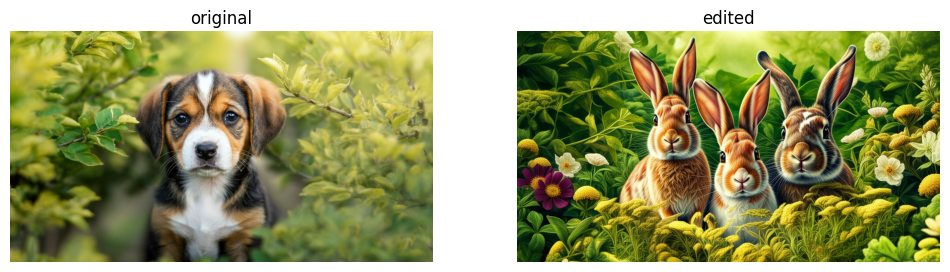

In [13]:
image_url, prompt_json = call_gemini_for_editing("20250114144739 edit orchard.png","강아지를 토끼 세 마리로 바꿔줘")
edit_image(image_url, prompt_json)

EDIT_MODE_DEFAULT
A friendly dinosaur with green skin and a long tail standing in a field of grass and flowers, looking at a grey tabby cat. The dinosaur has a playful expression on its face.


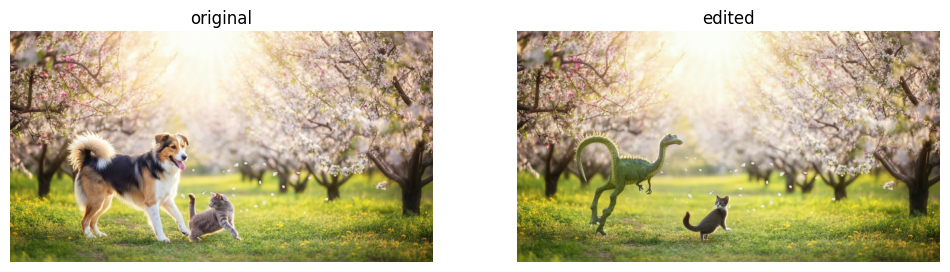

In [323]:
image_url, prompt_json = call_gemini_for_editing("20250114145005 꽃이 만발한 과수원에서 뛰어노는 강아지와 고양이.png","강아지를 공룡으로 바꿔줘") 
prompt_json["edit_mode"]
edit_image(image_url, prompt_json)

SUBJECT_EDITING
A cute tabby cat with white markings, looking directly at the camera, with a blue background.


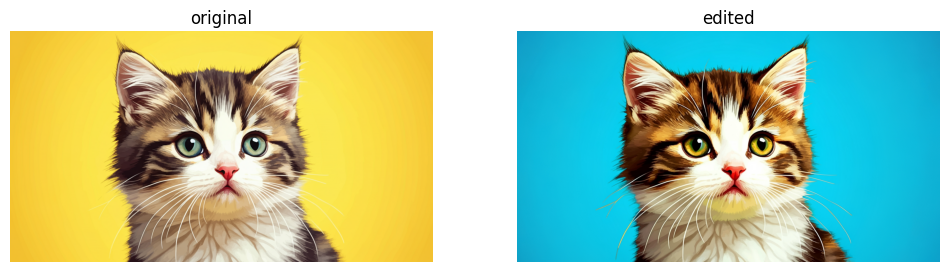

In [152]:
image_url, prompt_json = call_gemini_for_editing("20250114145217 귀여운 고양이 노란색 바탕.png","파란색 배경으로 바꿔줘")
edit_image(image_url, prompt_json)

EDIT_MODE_DEFAULT
A cute puppy with brown fur and white markings, looking up with big, round eyes. The background is a solid, bright pink.


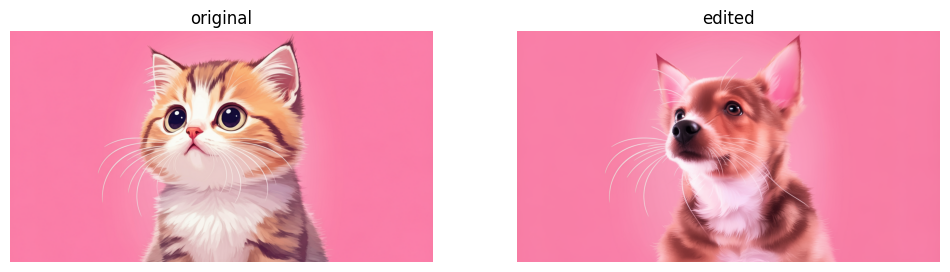

In [153]:
image_url, prompt_json = call_gemini_for_editing("20250114145552 귀여운 고양이 핑크 바탕, 일러스트 스타일.png","고양이를 강아지로 바꿔줘")
edit_image(image_url, prompt_json)

SUBJECT_EDITING
A pink and white dog with a pink collar is looking to the left, with a blue background.


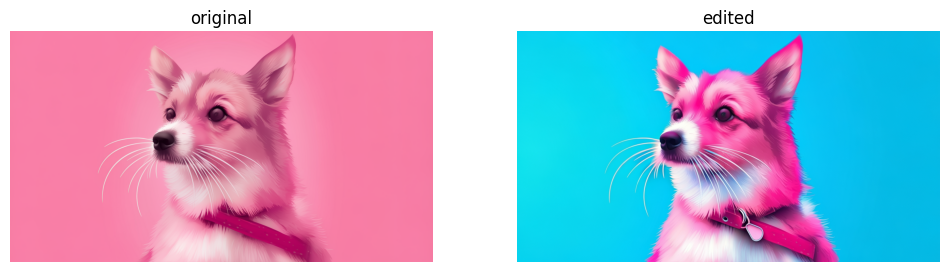

In [154]:
image_url, prompt_json = call_gemini_for_editing("20250114145653 edit dog.png","파란색 배경으로 바꿔줘")
edit_image(image_url, prompt_json)

INSTRUCT_EDITING
Transform the image into an oil painting style. The dog should be the main focus of the painting, with a soft and dreamy background. Use vibrant colors and bold brushstrokes to create a sense of movement and energy.


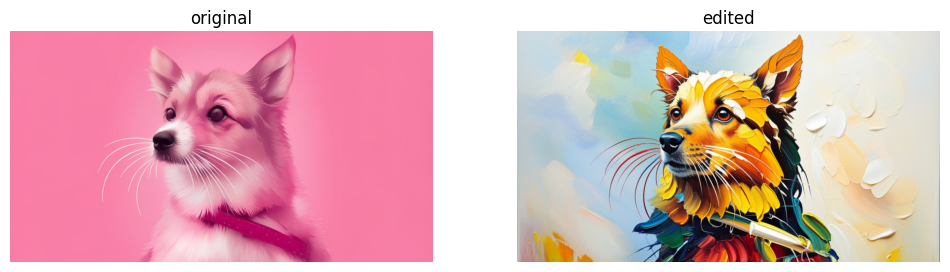

In [172]:
image_url, prompt_json = call_gemini_for_editing("20250114145653 edit dog.png","유화 스타일로 바꿔줘")
edit_image(image_url, prompt_json)

INSTRUCT_EDITING
Transform the image into an oil painting style with a black cat sitting on a rocky cliff overlooking a body of water at sunset. The sky should be a vibrant purple and orange, with the sun setting in the distance. The cat should be looking out at the water, with a serene expression.


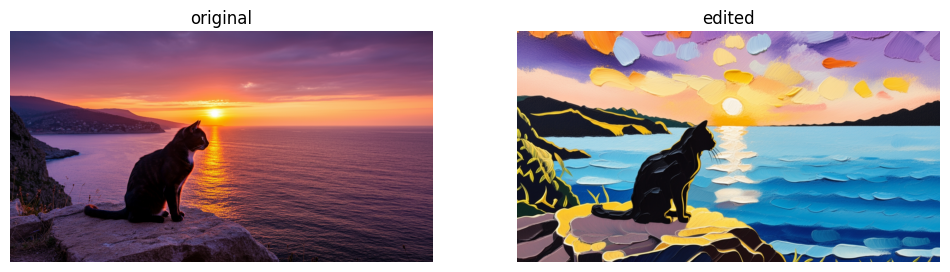

In [319]:
image_url, prompt_json = call_gemini_for_editing("20250114150226 검은 고양이, 석양이 지는 바다, 사진 스타일.png","유화 스타일로 바꿔줘")
edit_image(image_url, prompt_json)

SUBJECT_EDITING
A white cat sitting on a rocky cliff overlooking a blue ocean. The sky is filled with yellow and blue clouds. The painting has a painterly style, with visible brushstrokes and a textured surface.


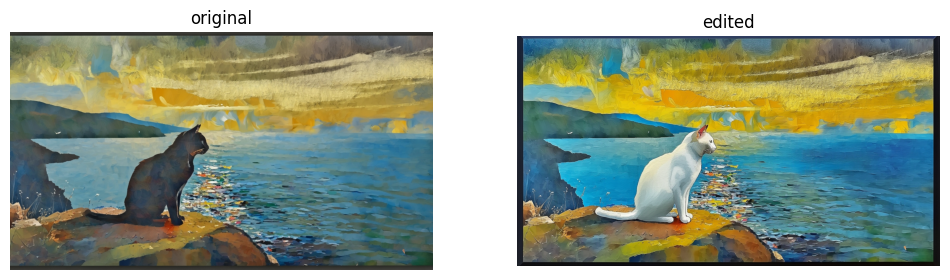

In [320]:
image_url, prompt_json = call_gemini_for_editing("20250114150329 edit Oil Painting.png","고양이를 하얀색으로 바꿔줘")
prompt_json
edit_image(image_url, prompt_json)

INSTRUCT_EDITING
Transform the image into a cartoon style. Make the baseball players look like they are in a cartoon, with exaggerated features and bright colors. Add a cartoon background with a baseball stadium and a crowd of cheering fans. Make the overall style bright and cheerful.


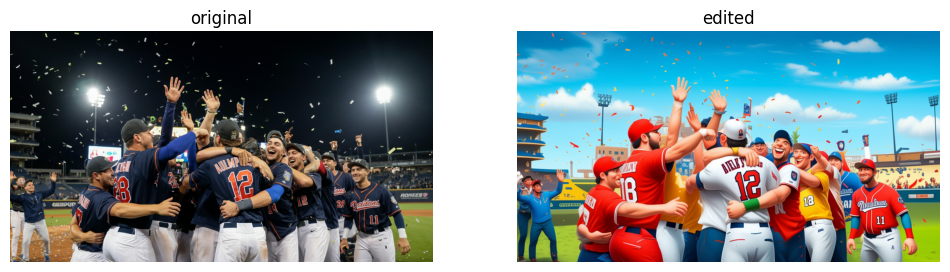

In [161]:
image_url, prompt_json = call_gemini_for_editing("20250114150925 LG 트윈스 우승 순간, 사진 스타일.png","만화 스타일로 바꿔줘")
edit_image(image_url, prompt_json)

INSTRUCT_EDITING
Transform the image into a painting style, with warm colors and soft lighting. The friends should be laughing and enjoying each other's company.  The table should be full of delicious Korean food, and the atmosphere should be festive and joyful.


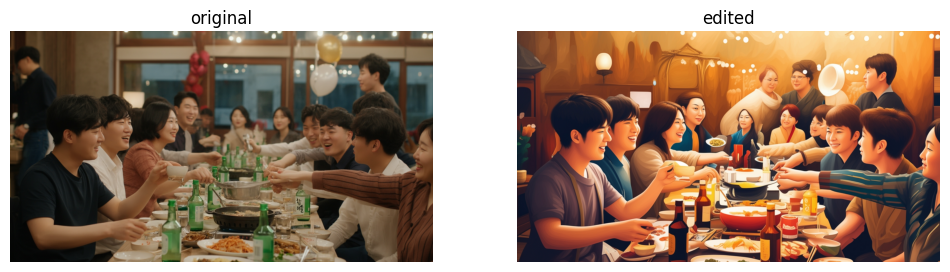

In [321]:
image_url, prompt_json = call_gemini_for_editing("20250114152115 한국의 연말회식, 사진 스타일.png","유화 스타일로 바꿔줘")
edit_image(image_url, prompt_json)

INSTRUCT_EDITING
Transform the image into a manga style. The characters should have big eyes and exaggerated expressions. The background should be simple and stylized. The overall tone should be lighthearted and fun. 


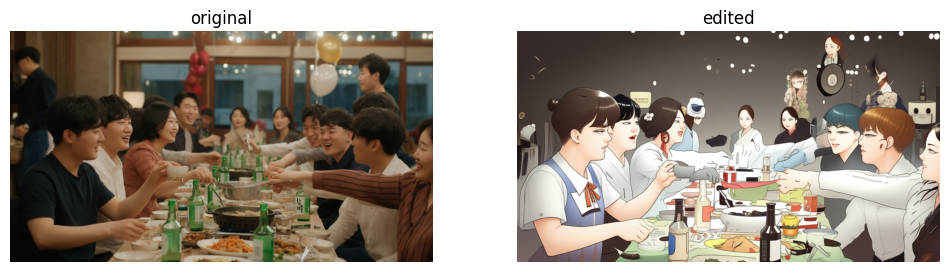

In [163]:
image_url, prompt_json = call_gemini_for_editing("20250114152115 한국의 연말회식, 사진 스타일.png","만화 스타일로 바꿔줘")
edit_image(image_url, prompt_json)

INSTRUCT_EDITING
Transform the image into a watercolor painting style. The alien should be the main focus of the image, with the nebula and asteroids in the background. The colors should be vibrant and the overall effect should be dreamy and ethereal.


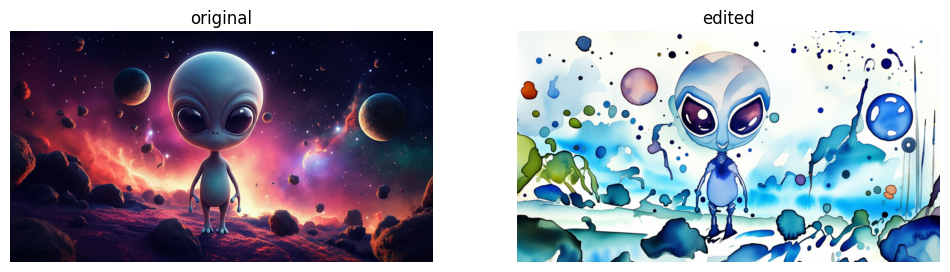

In [175]:
image_url, prompt_json = call_gemini_for_editing("20250114152647 귀여운 외계인과 우주, 3D 스타일.png","수채화 스타일로 바꿔줘")
edit_image(image_url, prompt_json)

INSTRUCT_EDITING
Transform the image into a watercolor painting style.  The trees should be green and yellow, and the sky should be blue. There should be a path leading through the trees. The background should be a field of yellow flowers. 


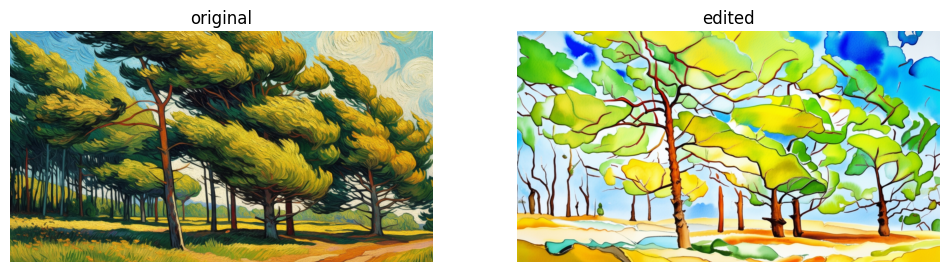

In [176]:
image_url, prompt_json = call_gemini_for_editing("20250114152904 바람에 흔들리는 나무와 숲, 고흐 스타일.png","수채화 스타일로 바꿔줘")
edit_image(image_url, prompt_json)